In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import librosa
import librosa.display as ldp
import librosa.beat as lbt

In [ ]:
data, sample_rate = librosa.load('./samples/304_full_easy-as-it-goes_0152_preview.wav', sr=None)
# data, sample_rate = librosa.load(librosa.ex('trumpet'), sr=None)

In [53]:
def visualise_wave(chunk, sample_rate, chunk_start, chunk_length):
    plt.figure()
    ldp.waveplot(chunk, sample_rate, x_axis='time')
    plt.title('waveplot')
    # plt.xlim(chunk_start, chunk_start + chunk_length)
    plt.xlabel('time [s]')
    plt.show()

def visualise_beats(chunk, sample_rate, chunk_start, chunk_length):
    bpm, beats_chunk = lbt.beat_track(chunk, sr=sample_rate, units='time')
    beats_chunk += chunk_start

    print('%3d bpm' % bpm)
    plt.figure()
    plt.plot(beats_chunk, ['pulse'] * beats_chunk.size, '.')
    plt.title('pulseplot')
    plt.xlim(chunk_start, chunk_start + chunk_length)
    plt.xlabel('time [s]')
    plt.show()

def visualise_chroma(chunk, sample_rate, chunk_start, chunk_length):
    t_chroma = librosa.feature.chroma_cqt(chunk, sample_rate)

    plt.figure()
    ldp.specshow(t_chroma, sr=sample_rate, x_axis='time', y_axis='chroma')
    plt.title('chromagram')
    # plt.xlim(chunk_start, chunk_start + chunk_length)
    plt.xlabel('time [s]')
    plt.colorbar()
    plt.show()


sample rate:        44100
chunk length:        15 s
samples per chunk: 661500
number of chunks:      10
chunk   1:


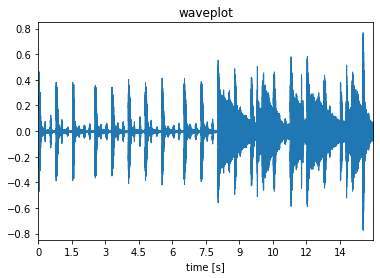

120 bpm


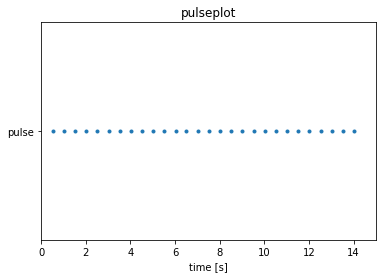

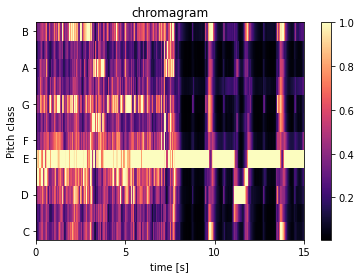

chunk   2:


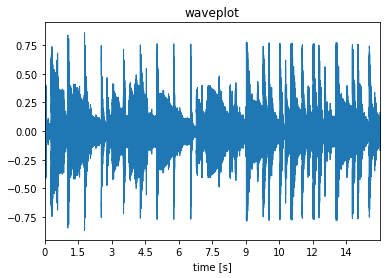

120 bpm


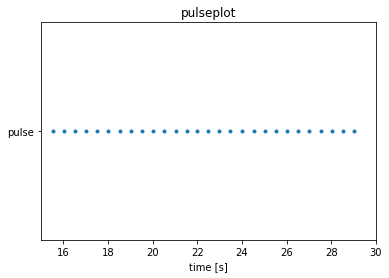

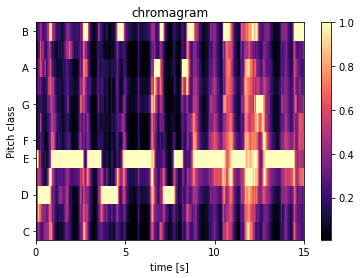

chunk   3:


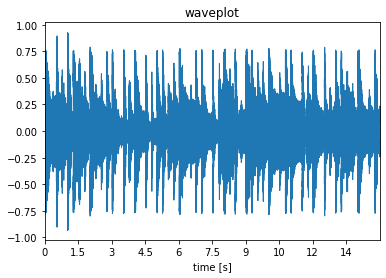

120 bpm


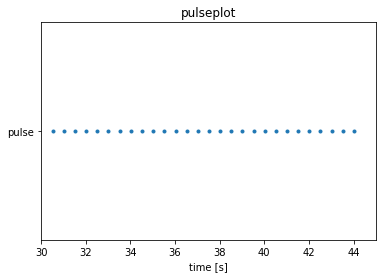

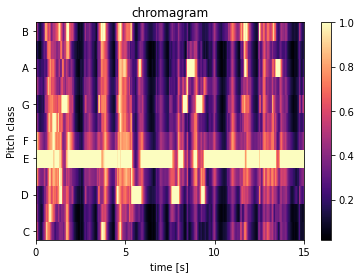

chunk   4:


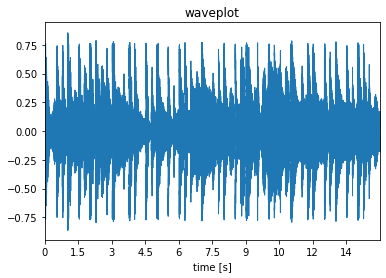

120 bpm


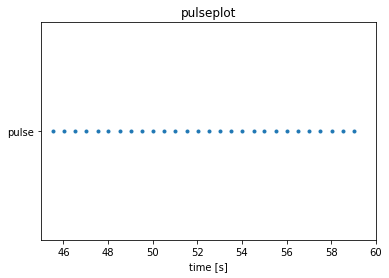

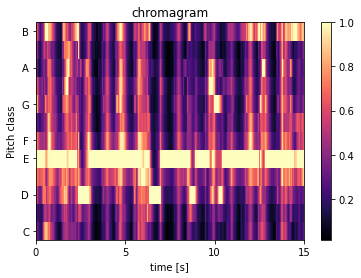

chunk   5:


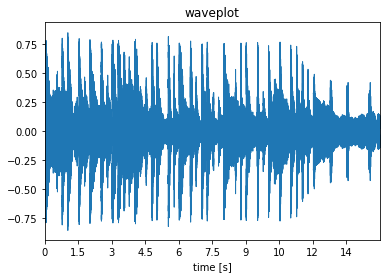

120 bpm


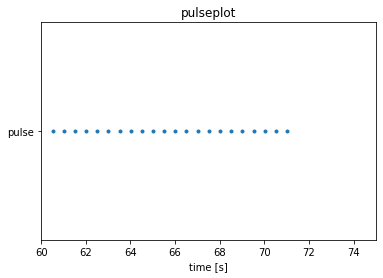

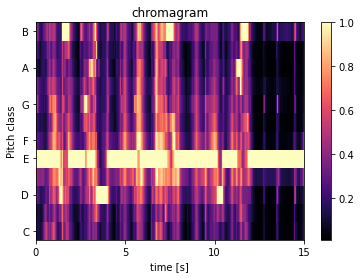

chunk   6:


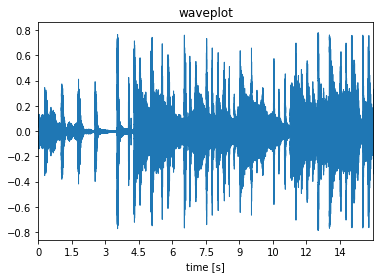

120 bpm


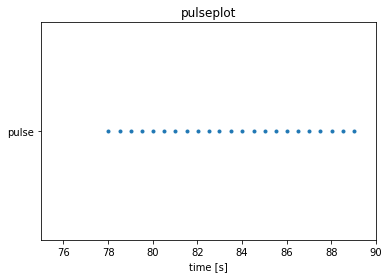

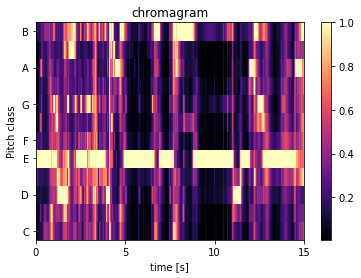

chunk   7:


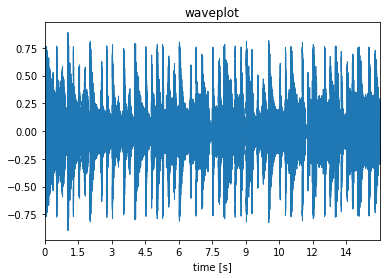

120 bpm


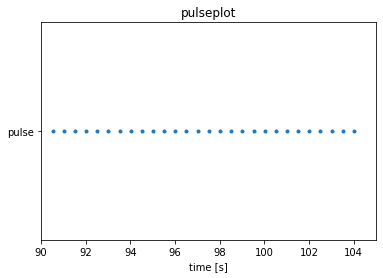

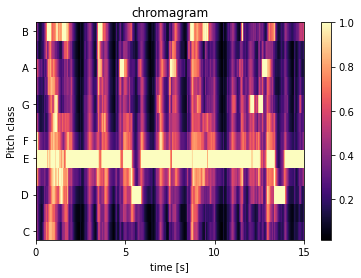

chunk   8:


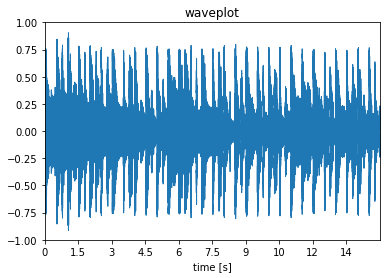

120 bpm


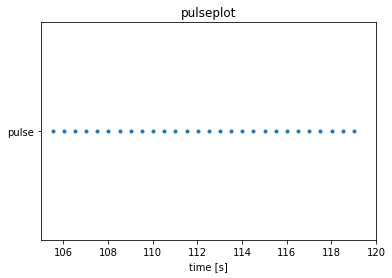

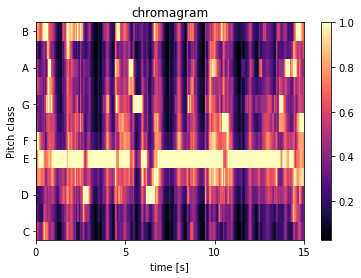

chunk   9:


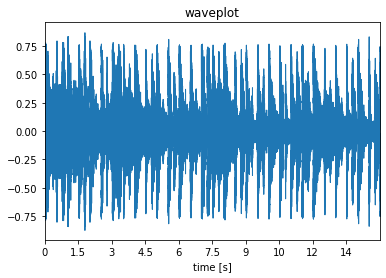

120 bpm


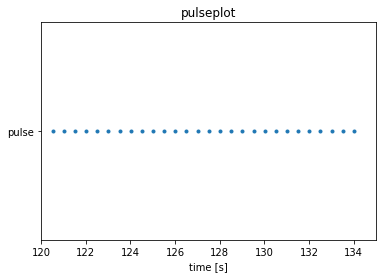

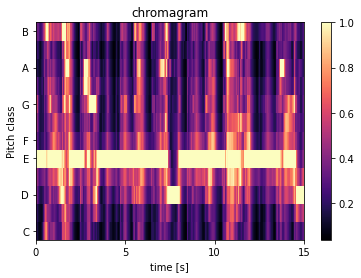

chunk  10:


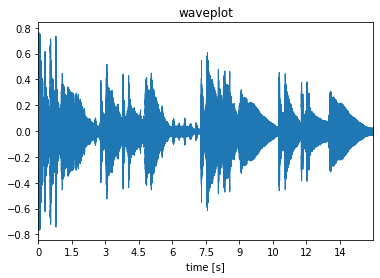

120 bpm


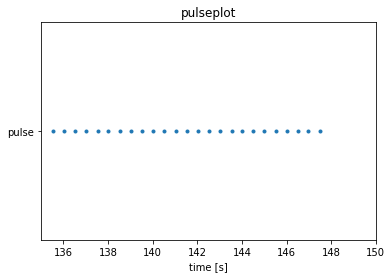

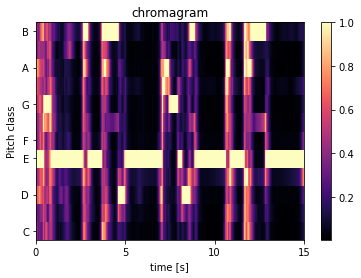

In [54]:
chunk_length = 15 # seconds
samples_per_chunk = chunk_length * sample_rate
number_chunks = len(data) // samples_per_chunk

print('sample rate:       %6d' % sample_rate)
print('chunk length:       %3d s' % chunk_length)
print('samples per chunk: %6d' % samples_per_chunk)
print('number of chunks:     %3d' % number_chunks)

chunk_start = 0 # seconds

for c in range(number_chunks):
    chunk_start = c * chunk_length
    chunk = data[c * samples_per_chunk : (c+1) * samples_per_chunk]

    print('chunk %3d:' % (c+1))
    visualise_wave(chunk, sample_rate, chunk_start, chunk_length)
    visualise_beats(chunk, sample_rate, chunk_start, chunk_length)
    visualise_chroma(chunk, sample_rate, chunk_start, chunk_length)